<a href="https://colab.research.google.com/github/beercafeguy/PyMLLab/blob/master/EDA/Handling_Missing_Values.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv('NFL_Play_by_Play_2009_2016_v3.csv',low_memory=False)

In [5]:
df.isnull().sum()

Date            0
GameID          0
Drive           0
qtr             0
down         3120
            ...  
Win_Prob     1328
WPA           311
airWPA      12626
yacWPA      12640
Season          1
Length: 102, dtype: int64

In [6]:
df.head()

,Date,GameID,Drive,qtr,down,time,TimeUnder,TimeSecs,PlayTimeDiff,SideofField,...,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2009-09-10,2009091000,1,1,NaN,15:00,15,3600.0,0.0,TEN,...,NaN,0.485675,0.514325,0.546433,0.453567,0.485675,0.060758,NaN,NaN,2009.0
1,2009-09-10,2009091000,1,1,1.0,14:53,15,3593.0,7.0,PIT,...,1.146076,0.546433,0.453567,0.551088,0.448912,0.546433,0.004655,-0.032244,0.036899,2009.0
2,2009-09-10,2009091000,1,1,2.0,14:16,15,3556.0,37.0,PIT,...,NaN,0.551088,0.448912,0.510793,0.489207,0.551088,-0.040295,NaN,NaN,2009.0
3,2009-09-10,2009091000,1,1,3.0,13:35,14,3515.0,41.0,PIT,...,-5.031425,0.510793,0.489207,0.461217,0.538783,0.510793,-0.049576,0.106663,-0.156239,2009.0
4,2009-09-10,2009091000,1,1,4.0,13:27,14,3507.0,8.0,PIT,...,NaN,0.461217,0.538783,0.558929,0.441071,0.461217,0.097712,NaN,NaN,2009.0


In [7]:
np.random.seed(2023)

In [18]:
((df.isnull().sum()/df.shape[0])*100)

Date              0.000000
GameID            0.000000
Drive             0.000000
qtr               0.000000
down             15.398282
time              0.083901
TimeUnder         0.000000
TimeSecs          0.083901
PlayTimeDiff      0.167802
SideofField       0.143125
yrdln             0.192479
yrdline100        0.192479
ydstogo           0.000000
ydsnet            0.000000
GoalToGo          0.192479
FirstDown         7.136512
posteam           6.549205
DefensiveTeam     6.549205
desc              0.000000
PlayAttempted     0.000000
dtype: float64

In [21]:
# how many total missing values do we have?
total_cells = df.shape[0] * df.shape[1]
total_missing = df.isnull().sum().sum()
print(total_cells)
print(total_missing)
print((total_missing/total_cells)*100)

2066724
516576
24.99491949578173


In [22]:
missing_pct = ((df.isnull().sum()/df.shape[0])*100)

In [28]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

print((missing_pct[missing_pct > 0.0]))

down                    15.398282
time                     0.083901
TimeSecs                 0.083901
PlayTimeDiff             0.167802
SideofField              0.143125
yrdln                    0.192479
yrdline100               0.192479
GoalToGo                 0.192479
FirstDown                7.136512
posteam                  6.549205
DefensiveTeam            6.549205
ExPointResult           97.458296
TwoPointConv            99.886487
DefTwoPoint            100.000000
PuntResult              94.260191
Passer                  60.374099
PassOutcome             60.369164
PassLength              60.645543
PassLocation            60.645543
Interceptor             98.850064
Rusher                  69.351495
RunLocation             69.642681
RunGap                  78.126542
Receiver                61.913928
ReturnResult            97.063469
Returner                92.182410
BlockingPlayer          99.985194
Tackler1                38.949758
Tackler2                85.682558
FieldGoalResul

In [32]:
df.dropna()

,Date,GameID,Drive,qtr,down,time,TimeUnder,TimeSecs,PlayTimeDiff,SideofField,yrdln,yrdline100,ydstogo,ydsnet,GoalToGo,FirstDown,posteam,DefensiveTeam,desc,PlayAttempted,Yards.Gained,sp,Touchdown,ExPointResult,TwoPointConv,DefTwoPoint,Safety,Onsidekick,PuntResult,PlayType,Passer,Passer_ID,PassAttempt,PassOutcome,PassLength,AirYards,YardsAfterCatch,QBHit,PassLocation,InterceptionThrown,Interceptor,Rusher,Rusher_ID,RushAttempt,RunLocation,RunGap,Receiver,Receiver_ID,Reception,ReturnResult,Returner,BlockingPlayer,Tackler1,Tackler2,FieldGoalResult,FieldGoalDistance,Fumble,RecFumbTeam,RecFumbPlayer,Sack,Challenge.Replay,ChalReplayResult,Accepted.Penalty,PenalizedTeam,PenaltyType,PenalizedPlayer,Penalty.Yards,PosTeamScore,DefTeamScore,ScoreDiff,AbsScoreDiff,HomeTeam,AwayTeam,Timeout_Indicator,Timeout_Team,posteam_timeouts_pre,HomeTimeouts_Remaining_Pre,AwayTimeouts_Remaining_Pre,HomeTimeouts_Remaining_Post,AwayTimeouts_Remaining_Post,No_Score_Prob,Opp_Field_Goal_Prob,Opp_Safety_Prob,Opp_Touchdown_Prob,Field_Goal_Prob,Safety_Prob,Touchdown_Prob,ExPoint_Prob,TwoPoint_Prob,ExpPts,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season


In [34]:
# drop columns with missing values
non_null_cols = df.dropna(axis=1)
non_null_cols.head()

,Date,GameID,Drive,qtr,TimeUnder,ydstogo,ydsnet,desc,PlayAttempted,Yards.Gained,sp,Touchdown,Safety,Onsidekick,PlayType,Passer_ID,PassAttempt,AirYards,YardsAfterCatch,QBHit,InterceptionThrown,Rusher_ID,RushAttempt,Receiver_ID,Reception,Fumble,Sack,Challenge.Replay,Accepted.Penalty,Penalty.Yards,HomeTeam,AwayTeam,Timeout_Indicator,Timeout_Team,posteam_timeouts_pre,HomeTimeouts_Remaining_Pre,AwayTimeouts_Remaining_Pre,HomeTimeouts_Remaining_Post,AwayTimeouts_Remaining_Post,ExPoint_Prob,TwoPoint_Prob
0,2009-09-10,2009091000,1,1,15,0,0,R.Bironas kicks 67 yards from TEN 30 to PIT 3. S.Logan to PIT 42 for 39 yards (M.Griffin).,1,39,0,0,0,0,Kickoff,None,0,0,0,0,0,None,0,None,0,0,0,0,0,0,PIT,TEN,0,None,3,3,3,3,3,0.0,0.0
1,2009-09-10,2009091000,1,1,15,10,5,(14:53) B.Roethlisberger pass short left to H.Ward to PIT 47 for 5 yards (C.Hope).,1,5,0,0,0,0,Pass,00-0022924,1,-3,8,0,0,None,0,00-0017162,1,0,0,0,0,0,PIT,TEN,0,None,3,3,3,3,3,0.0,0.0
2,2009-09-10,2009091000,1,1,15,5,2,(14:16) W.Parker right end to PIT 44 for -3 yards (S.Tulloch).,1,-3,0,0,0,0,Run,None,0,0,0,0,0,00-0022250,1,None,0,0,0,0,0,0,PIT,TEN,0,None,3,3,3,3,3,0.0,0.0
3,2009-09-10,2009091000,1,1,14,8,2,(13:35) (Shotgun) B.Roethlisberger pass incomplete deep right to M.Wallace. COVERAGE BY #24 HOPE,1,0,0,0,0,0,Pass,00-0022924,1,34,0,0,0,None,0,00-0026901,0,0,0,0,0,0,PIT,TEN,0,None,3,3,3,3,3,0.0,0.0
4,2009-09-10,2009091000,1,1,14,8,2,"(13:27) (Punt formation) D.Sepulveda punts 54 yards to TEN 2, Center-G.Warren, downed by PIT-K.Lewis.",1,0,0,0,0,0,Punt,None,0,0,0,0,0,None,0,None,0,0,0,0,0,0,PIT,TEN,0,None,3,3,3,3,3,0.0,0.0


In [39]:
sample_cols = df.loc[:,'EPA':'Season']

In [43]:
sample_cols.shape

(20262, 12)

In [44]:
sample_cols

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2.014474,NaN,NaN,4.856750e-01,5.143250e-01,5.464328e-01,4.535672e-01,4.856750e-01,6.075785e-02,NaN,NaN,2009.0
1,0.077907,-1.068169,1.146076,5.464328e-01,4.535672e-01,5.510878e-01,4.489122e-01,5.464328e-01,4.654977e-03,-3.224399e-02,3.689896e-02,2009.0
2,-1.402760,NaN,NaN,5.510878e-01,4.489122e-01,5.107931e-01,4.892069e-01,5.510878e-01,-4.029473e-02,NaN,NaN,2009.0
3,-1.712583,3.318841,-5.031425,5.107931e-01,4.892069e-01,4.612171e-01,5.387829e-01,5.107931e-01,-4.957598e-02,1.066626e-01,-1.562385e-01,2009.0
4,2.097796,NaN,NaN,4.612171e-01,5.387829e-01,5.589294e-01,4.410706e-01,4.612171e-01,9.771229e-02,NaN,NaN,2009.0
5,-0.696302,NaN,NaN,5.589294e-01,4.410706e-01,5.784532e-01,4.215468e-01,4.410706e-01,-1.952383e-02,NaN,NaN,2009.0
6,-0.179149,-0.343085,0.163935,5.784532e-01,4.215468e-01,5.828805e-01,4.171195e-01,4.215468e-01,-4.427284e-03,-1.045610e-02,6.028821e-03,2009.0
7,-1.119477,NaN,NaN,5.828805e-01,4.171195e-01,6.175437e-01,3.824563e-01,4.171195e-01,-3.466317e-02,NaN,NaN,2009.0
8,-0.021313,NaN,NaN,6.175437e-01,3.824563e-01,5.914892e-01,4.085108e-01,3.824563e-01,2.605448e-02,NaN,NaN,2009.0
9,-0.215293,-0.756894,0.541602,5.914892e-01,4.085108e-01,5.854050e-01,4.145950e-01,5.914892e-01,-6.084153e-03,-2.452580e-02,1.844165e-02,2009.0


### Fill with 0

In [45]:
sample_cols.head()

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2.014474,NaN,NaN,0.485675,0.514325,0.546433,0.453567,0.485675,0.060758,NaN,NaN,2009.0
1,0.077907,-1.068169,1.146076,0.546433,0.453567,0.551088,0.448912,0.546433,0.004655,-0.032244,0.036899,2009.0
2,-1.402760,NaN,NaN,0.551088,0.448912,0.510793,0.489207,0.551088,-0.040295,NaN,NaN,2009.0
3,-1.712583,3.318841,-5.031425,0.510793,0.489207,0.461217,0.538783,0.510793,-0.049576,0.106663,-0.156239,2009.0
4,2.097796,NaN,NaN,0.461217,0.538783,0.558929,0.441071,0.461217,0.097712,NaN,NaN,2009.0


In [48]:
sample_cols['airEPA'].fillna(0,inplace=True)

In [49]:
sample_cols.head()

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2.014474,0.000000,NaN,0.485675,0.514325,0.546433,0.453567,0.485675,0.060758,NaN,NaN,2009.0
1,0.077907,-1.068169,1.146076,0.546433,0.453567,0.551088,0.448912,0.546433,0.004655,-0.032244,0.036899,2009.0
2,-1.402760,0.000000,NaN,0.551088,0.448912,0.510793,0.489207,0.551088,-0.040295,NaN,NaN,2009.0
3,-1.712583,3.318841,-5.031425,0.510793,0.489207,0.461217,0.538783,0.510793,-0.049576,0.106663,-0.156239,2009.0
4,2.097796,0.000000,NaN,0.461217,0.538783,0.558929,0.441071,0.461217,0.097712,NaN,NaN,2009.0


### Fil with the last value in column

In [50]:
sample_cols['yacEPA'].fillna(method='bfill',inplace=True)

In [51]:
sample_cols.head()

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2.014474,0.000000,1.146076,0.485675,0.514325,0.546433,0.453567,0.485675,0.060758,NaN,NaN,2009.0
1,0.077907,-1.068169,1.146076,0.546433,0.453567,0.551088,0.448912,0.546433,0.004655,-0.032244,0.036899,2009.0
2,-1.402760,0.000000,-5.031425,0.551088,0.448912,0.510793,0.489207,0.551088,-0.040295,NaN,NaN,2009.0
3,-1.712583,3.318841,-5.031425,0.510793,0.489207,0.461217,0.538783,0.510793,-0.049576,0.106663,-0.156239,2009.0
4,2.097796,0.000000,0.163935,0.461217,0.538783,0.558929,0.441071,0.461217,0.097712,NaN,NaN,2009.0


### Fill with mean

In [54]:
sample_cols['airWPA'].fillna(sample_cols['airWPA'].mean(),inplace=True)

In [55]:
sample_cols.head()

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2.014474,0.000000,1.146076,0.485675,0.514325,0.546433,0.453567,0.485675,0.060758,0.013397,NaN,2009.0
1,0.077907,-1.068169,1.146076,0.546433,0.453567,0.551088,0.448912,0.546433,0.004655,-0.032244,0.036899,2009.0
2,-1.402760,0.000000,-5.031425,0.551088,0.448912,0.510793,0.489207,0.551088,-0.040295,0.013397,NaN,2009.0
3,-1.712583,3.318841,-5.031425,0.510793,0.489207,0.461217,0.538783,0.510793,-0.049576,0.106663,-0.156239,2009.0
4,2.097796,0.000000,0.163935,0.461217,0.538783,0.558929,0.441071,0.461217,0.097712,0.013397,NaN,2009.0


### KNN Impter for filling values

<Axes: ylabel='Frequency'>

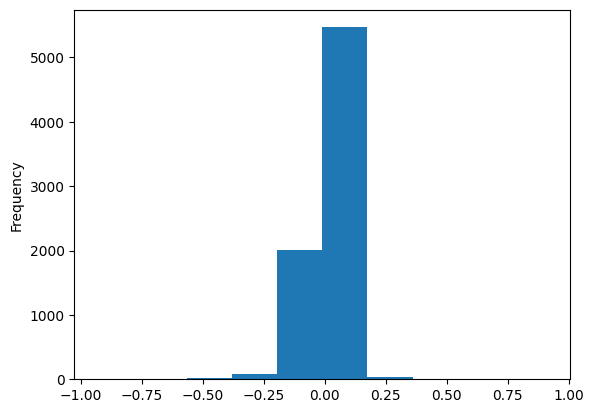

In [57]:
sample_cols['yacWPA'].plot(kind='hist')

<Axes: ylabel='Frequency'>

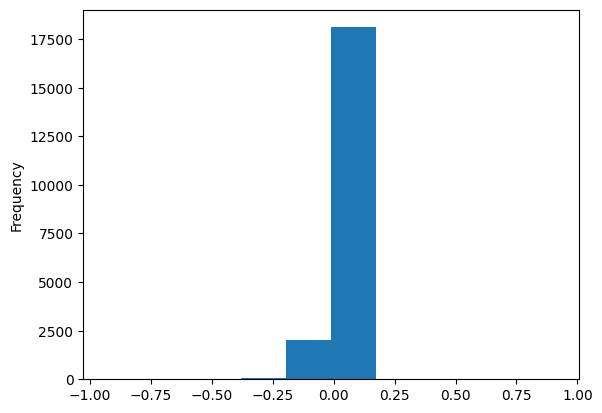

In [59]:
sample_cols['yacWPA'].fillna(sample_cols['yacWPA'].mean()).plot(kind='hist')

In [61]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
sample_cols_scaled = pd.DataFrame(scaler.fit_transform(sample_cols),columns=sample_cols.columns)

In [62]:
sample_cols_scaled.head(20)

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,0.648954,0.509916,0.631187,0.485675,0.514325,0.546433,0.453567,0.485675,0.625709,0.492204,NaN,0.0
1,0.555296,0.428557,0.631187,0.546433,0.453567,0.551088,0.448912,0.546433,0.592529,0.468001,0.525444,0.0
2,0.483687,0.509916,0.338921,0.551088,0.448912,0.510793,0.489207,0.551088,0.565945,0.492204,NaN,0.0
3,0.468703,0.762701,0.338921,0.510793,0.489207,0.461217,0.538783,0.510793,0.560455,0.541662,0.421040,0.0
4,0.652984,0.509916,0.584721,0.461217,0.538783,0.558929,0.441071,0.461217,0.647565,0.492204,NaN,0.0
5,0.517853,0.509916,0.584721,0.558929,0.441071,0.578453,0.421547,0.441071,0.578229,0.492204,NaN,0.0
6,0.542864,0.483784,0.584721,0.578453,0.421547,0.582881,0.417119,0.421547,0.587157,0.479555,0.508756,0.0
7,0.497387,0.509916,0.602589,0.582881,0.417119,0.617544,0.382456,0.417119,0.569275,0.492204,NaN,0.0
8,0.550498,0.509916,0.602589,0.617544,0.382456,0.591489,0.408511,0.382456,0.605185,0.492204,NaN,0.0
9,0.541116,0.452266,0.602589,0.591489,0.408511,0.585405,0.414595,0.591489,0.586177,0.472094,0.515466,0.0


In [63]:
from sklearn.impute import KNNImputer

imputer  = KNNImputer(n_neighbors=5)
sample_cols_imputted = pd.DataFrame(imputer.fit_transform(sample_cols_scaled),columns=sample_cols_scaled.columns)
sample_cols_imputted.head(10)

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,0.648954,0.509916,0.631187,0.485675,0.514325,0.546433,0.453567,0.485675,0.625709,0.492204,0.531401,0.0
1,0.555296,0.428557,0.631187,0.546433,0.453567,0.551088,0.448912,0.546433,0.592529,0.468001,0.525444,0.0
2,0.483687,0.509916,0.338921,0.551088,0.448912,0.510793,0.489207,0.551088,0.565945,0.492204,0.450991,0.0
3,0.468703,0.762701,0.338921,0.510793,0.489207,0.461217,0.538783,0.510793,0.560455,0.541662,0.421040,0.0
4,0.652984,0.509916,0.584721,0.461217,0.538783,0.558929,0.441071,0.461217,0.647565,0.492204,0.519504,0.0
5,0.517853,0.509916,0.584721,0.558929,0.441071,0.578453,0.421547,0.441071,0.578229,0.492204,0.499411,0.0
6,0.542864,0.483784,0.584721,0.578453,0.421547,0.582881,0.417119,0.421547,0.587157,0.479555,0.508756,0.0
7,0.497387,0.509916,0.602589,0.582881,0.417119,0.617544,0.382456,0.417119,0.569275,0.492204,0.501319,0.0
8,0.550498,0.509916,0.602589,0.617544,0.382456,0.591489,0.408511,0.382456,0.605185,0.492204,0.508126,0.0
9,0.541116,0.452266,0.602589,0.591489,0.408511,0.585405,0.414595,0.591489,0.586177,0.472094,0.515466,0.0


In [64]:
sample_cols_scaled.head(10)

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,0.648954,0.509916,0.631187,0.485675,0.514325,0.546433,0.453567,0.485675,0.625709,0.492204,NaN,0.0
1,0.555296,0.428557,0.631187,0.546433,0.453567,0.551088,0.448912,0.546433,0.592529,0.468001,0.525444,0.0
2,0.483687,0.509916,0.338921,0.551088,0.448912,0.510793,0.489207,0.551088,0.565945,0.492204,NaN,0.0
3,0.468703,0.762701,0.338921,0.510793,0.489207,0.461217,0.538783,0.510793,0.560455,0.541662,0.421040,0.0
4,0.652984,0.509916,0.584721,0.461217,0.538783,0.558929,0.441071,0.461217,0.647565,0.492204,NaN,0.0
5,0.517853,0.509916,0.584721,0.558929,0.441071,0.578453,0.421547,0.441071,0.578229,0.492204,NaN,0.0
6,0.542864,0.483784,0.584721,0.578453,0.421547,0.582881,0.417119,0.421547,0.587157,0.479555,0.508756,0.0
7,0.497387,0.509916,0.602589,0.582881,0.417119,0.617544,0.382456,0.417119,0.569275,0.492204,NaN,0.0
8,0.550498,0.509916,0.602589,0.617544,0.382456,0.591489,0.408511,0.382456,0.605185,0.492204,NaN,0.0
9,0.541116,0.452266,0.602589,0.591489,0.408511,0.585405,0.414595,0.591489,0.586177,0.472094,0.515466,0.0


In [68]:
sample_cols_reverse_scaled = pd.DataFrame(scaler.inverse_transform(sample_cols_imputted),columns=sample_cols_imputted.columns)
sample_cols_reverse_scaled.head()

,EPA,airEPA,yacEPA,Home_WP_pre,Away_WP_pre,Home_WP_post,Away_WP_post,Win_Prob,WPA,airWPA,yacWPA,Season
0,2.014474,0.000000,1.146076,0.485675,0.514325,0.546433,0.453567,0.485675,0.060758,0.013397,0.047919,2009.0
1,0.077907,-1.068169,1.146076,0.546433,0.453567,0.551088,0.448912,0.546433,0.004655,-0.032244,0.036899,2009.0
2,-1.402760,0.000000,-5.031425,0.551088,0.448912,0.510793,0.489207,0.551088,-0.040295,0.013397,-0.100832,2009.0
3,-1.712583,3.318841,-5.031425,0.510793,0.489207,0.461217,0.538783,0.510793,-0.049576,0.106663,-0.156239,2009.0
4,2.097796,0.000000,0.163935,0.461217,0.538783,0.558929,0.441071,0.461217,0.097712,0.013397,0.025910,2009.0


<Axes: ylabel='Frequency'>

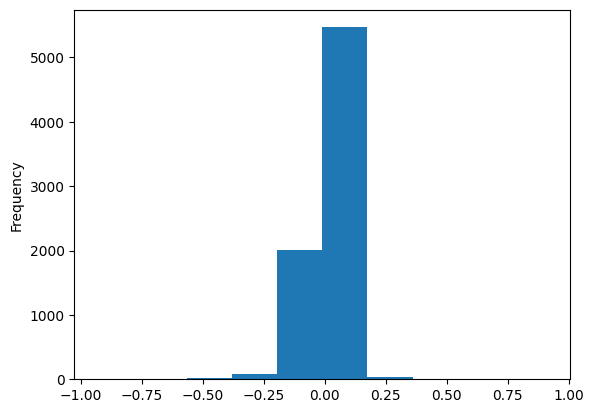

In [69]:
sample_cols['yacWPA'].plot(kind='hist')

<Axes: ylabel='Frequency'>

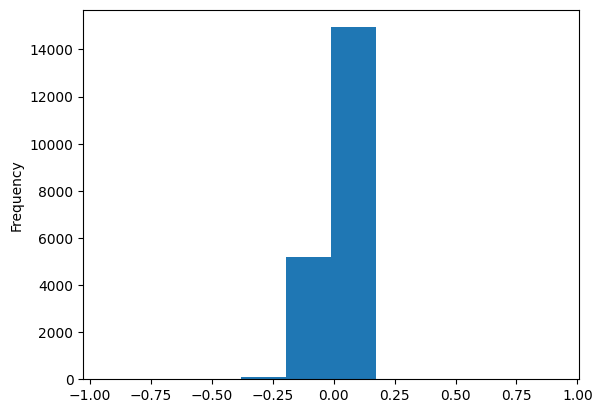

In [70]:
sample_cols_reverse_scaled['yacWPA'].plot(kind='hist')